In [ ]:
import warnings
warnings.filterwarnings('ignore')
!pip install ultralytics
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video
import torch as torch
import torchvision
import random
import time

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.9/871.9 kB 13.6 MB/s eta 0:00:00


In [ ]:
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

In [ ]:
model=YOLO('yolov8m_final.pt')

NameError: name 'YOLO' is not defined

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"karthigamed23b028","key":"a81b4750d4c5e56569add2c50cc73abd"}'}

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json #this is to ensure only i have the acccess to read and write permissions for my Kaggle API token file--chmod: change mode used to modify file permissions,6-read and write permission,0-group permission no access,0-others permission no access

In [ ]:
!kaggle datasets download -d farzadnekouei/top-view-vehicle-detection-image-dataset

Dataset URL: https://www.kaggle.com/datasets/farzadnekouei/top-view-vehicle-detection-image-dataset
License(s): Attribution 4.0 International (CC BY 4.0)
 72% 33.0M/45.6M [00:00<00:00, 57.7MB/s]
100% 45.6M/45.6M [00:00<00:00, 67.5MB/s]


In [ ]:
!ls

sample_data  top-view-vehicle-detection-image-dataset.zip  yolov8m.pt


In [ ]:
!unzip top-view-vehicle-detection-image-dataset.zip

Archive:  top-view-vehicle-detection-image-dataset.zip
  inflating: Vehicle_Detection_Image_Dataset/README.dataset.txt  
  inflating: Vehicle_Detection_Image_Dataset/README.roboflow.txt  
  inflating: Vehicle_Detection_Image_Dataset/data.yaml  
  inflating: Vehicle_Detection_Image_Dataset/sample_image.jpg  
  inflating: Vehicle_Detection_Image_Dataset/sample_video.mp4  
  inflating: Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.b87509668caff369c5501325477e6d9a.jpg  
  inflating: Vehicle_Detection_Image_Dataset/train/images/10_mp4-10_jpg.rf.ba480b311472ef957256801c3766128a.jpg  
  inflating: Vehicle_Detection_Image_Dataset/train/images/10_mp4-11_jpg.rf.eb1b06090bd1c1814b87c18a2661990a.jpg  
  inflating: Vehicle_Detection_Image_Dataset/train/images/10_mp4-12_jpg.rf.daf65f51adfd1817d026f3d4c3cf3d4c.jpg  
  inflating: Vehicle_Detection_Image_Dataset/train/images/10_mp4-14_jpg.rf.0f71b11f7cbb40b498e9f8032bf9a51c.jpg  
  inflating: Vehicle_Detection_Image_Dataset/train/images

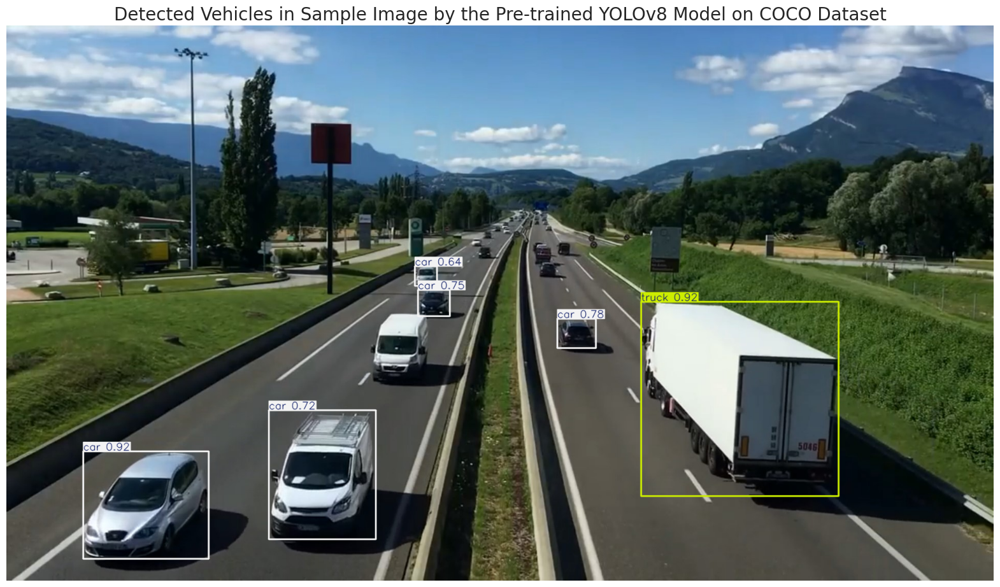

In [ ]:
image_path = '/content/Vehicle_Detection_Image_Dataset/sample_image.jpg'

results = model.predict(source=image_path,
                        imgsz=640,
                        verbose=False,# Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.6)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Vehicles in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
dataset_path = 'Vehicle_Detection_Image_Dataset'

# Set the path YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# yaml_file_path='C:/Users/karth/Desktop/UTM/kaggle_dataset/env/Vehicle_Detection_Image_Dataset\data.yaml'

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader = yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



In [ ]:
# Set paths for training and validation images sets
train_image_path = os.path.join(dataset_path, 'train', 'images')
validation_image_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_size = set()
valid_image_size = set()

# Check train images sizes and count
for filename in os.listdir(train_image_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_image_path, filename)
        with Image.open(image_path) as img:
            train_image_size.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(validation_image_path):
    if filename.endswith('.jpg'):
        num_valid_images +=1
        image_path = os.path.join(validation_image_path, filename)
        with Image.open(image_path) as img:
            valid_image_size.add(img.size)


print(f"Number of training images:, {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_size) == 1:
    print(f"All training images have the same size: {train_image_size.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images is validation set have same size
if len(valid_image_size) == 1:
    print(f"All validation images have the same size: {valid_image_size.pop()}")

else:
    print("Validation images have varying sizes")

Number of training images:, 536
Number of validation images: 90
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


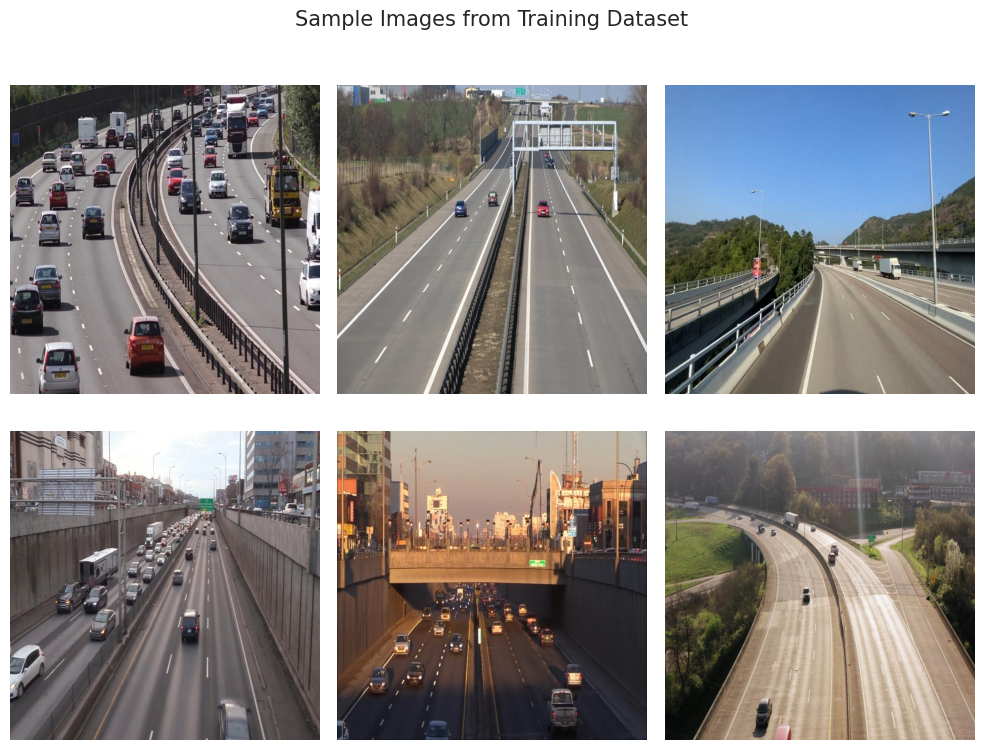

In [ ]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_image_path) if file.endswith('.jpg')]

# Select 6 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(20, num_images, num_images // 6)]

fig,axes = plt.subplots(2,3,figsize=(10,8))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path =os.path.join(train_image_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset',fontsize=15)
plt.tight_layout()
plt.show()

In [ ]:
# optimizers=['Adam','SGD','RMSprop','Adadelta']
# Using different optimizers
# for opm in optimizers:
    # print(f"Training with {opm} optimizer")
start_time=time.time()
results = model.train(#in data.yaml file change data paths from ..train or valid/images to /content/Vehicle_Detection_Image_Dataset
data = yaml_file_path,
epochs = 100,
imgsz=640,
# device=0,
patience = 50,
batch = 32,
optimizer='Adam',
lr0 = 0.0001,
lrf = 0.1,
momentum = 0.937,
weight_decay = 0.0005,
dropout=0.08
                    )
end_time=time.time()
duration=end_time-start_time
print(f"Training time : {duration} seconds")

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=Vehicle_Detection_Image_Dataset/data.yaml, epochs=100, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.08, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████| 755k/755k [00:00<00:00, 22.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 104MB/s]


AMP: checks passed ✅


train: Scanning /content/Vehicle_Detection_Image_Dataset/train/labels... 536 images, 0 backgrounds, 0 corrupt: 100%|██████████| 536/536 [00:00<00:00, 1972.76it/s]

train: New cache created: /content/Vehicle_Detection_Image_Dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Vehicle_Detection_Image_Dataset/valid/labels... 90 images, 0 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<00:00, 1359.81it/s]

val: New cache created: /content/Vehicle_Detection_Image_Dataset/valid/labels.cache


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: Adam(lr=0.0001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      13.6G      1.948      2.402       1.53        309        640: 100%|██████████| 17/17 [00:21<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.33s/it]

                   all         90        937    0.00463      0.133    0.00296   0.000944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      13.4G        1.2     0.8625      1.077        321        640: 100%|██████████| 17/17 [00:17<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         90        937    0.00463      0.133    0.00296   0.000944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        13G      1.145     0.7012      1.043        362        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         90        937    0.00463      0.133    0.00296   0.000944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      13.1G      1.089     0.6518      1.015        334        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]

                   all         90        937      0.306       0.61       0.46      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      13.1G      1.087     0.6306      1.011        344        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         90        937      0.693      0.707      0.736      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        13G      1.057     0.6068      1.004        208        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.849      0.891      0.935      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      13.5G      1.036     0.5767     0.9975        259        640: 100%|██████████| 17/17 [00:18<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.66s/it]

                   all         90        937      0.869      0.911      0.949      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100        13G      1.051     0.5904      1.001        350        640: 100%|██████████| 17/17 [00:18<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         90        937      0.892      0.928      0.963      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      13.2G      1.004     0.5514     0.9756        431        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         90        937      0.894       0.92      0.964      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      13.1G      1.029     0.5516     0.9867        366        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         90        937      0.917      0.907      0.968      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100        13G     0.9993     0.5335      0.975        409        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.912      0.911      0.965      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      13.1G      1.022     0.5454     0.9853        309        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.83s/it]

                   all         90        937      0.918      0.917      0.972       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      13.5G     0.9996     0.5338      0.983        287        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]

                   all         90        937        0.9      0.928      0.964      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100        13G     0.9982     0.5338     0.9752        296        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         90        937      0.901      0.928      0.961      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      13.5G     0.9823     0.5155     0.9708        366        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         90        937      0.914       0.92      0.969      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100        13G     0.9766     0.5113     0.9648        470        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.897      0.936      0.969      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      13.1G     0.9693     0.5091     0.9606        482        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.916      0.915      0.963       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      13.1G      0.967     0.5038     0.9537        407        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         90        937      0.899      0.934      0.966      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      13.4G     0.9574     0.4969     0.9607        293        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         90        937      0.912      0.924      0.966      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100        13G     0.9663     0.5013      0.964        331        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         90        937      0.917      0.918      0.961      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.4G     0.9542      0.492     0.9593        336        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         90        937      0.932      0.917      0.966      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.8G     0.9447     0.4876     0.9537        385        640: 100%|██████████| 17/17 [00:18<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]

                   all         90        937      0.899      0.933      0.969      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100        13G     0.9387     0.4809     0.9529        519        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.09it/s]

                   all         90        937      0.913      0.923      0.959      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100        13G     0.9335     0.4707     0.9513        356        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]

                   all         90        937      0.892       0.94      0.961      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      13.4G     0.9345      0.486      0.953        300        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         90        937      0.897      0.936      0.968       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      13.1G     0.9243     0.4731     0.9438        466        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.901      0.939      0.965      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.4G     0.9375     0.4881     0.9576        357        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         90        937      0.915      0.928      0.969      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      12.6G     0.9236     0.4838     0.9394        390        640: 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         90        937      0.889      0.921      0.959      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      13.5G     0.9389     0.4838     0.9578        288        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all         90        937      0.924       0.92      0.967      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100        13G     0.9221      0.476     0.9484        488        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.896      0.934      0.965      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      13.1G     0.9341     0.4793     0.9497        345        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.909      0.923       0.96      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100        13G     0.9115     0.4647      0.941        413        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937      0.916      0.914      0.961      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      13.4G     0.9179     0.4685     0.9439        267        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         90        937      0.921       0.93      0.962      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      13.1G     0.9097      0.465     0.9434        340        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]

                   all         90        937      0.911      0.931      0.961       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      13.4G     0.8994     0.4549     0.9373        362        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all         90        937      0.912      0.935      0.963      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.6G     0.9007     0.4579     0.9352        342        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.908      0.945      0.968      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      13.5G     0.8972     0.4561     0.9412        331        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.33it/s]

                   all         90        937      0.917      0.931      0.965      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      12.8G     0.8938     0.4511     0.9361        462        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         90        937      0.925      0.927       0.97      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      13.2G     0.8992     0.4538     0.9282        343        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         90        937      0.907      0.931      0.967      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100        13G     0.8923     0.4574     0.9362        421        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.16it/s]

                   all         90        937      0.921      0.924      0.964      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      13.4G     0.8976     0.4547     0.9356        411        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         90        937      0.898      0.944      0.961      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100        13G     0.8899      0.448     0.9337        369        640: 100%|██████████| 17/17 [00:17<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         90        937      0.914      0.939      0.963      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      13.1G     0.8897     0.4484     0.9346        489        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         90        937      0.906      0.937      0.961      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      12.7G      0.889     0.4451     0.9332        461        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         90        937      0.907      0.942      0.969      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      13.1G      0.866     0.4345     0.9244        272        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]

                   all         90        937      0.907      0.941      0.963      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      12.7G     0.8787     0.4454     0.9309        454        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.05it/s]

                   all         90        937      0.909      0.935      0.966      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      13.4G      0.874     0.4481     0.9382        401        640: 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         90        937      0.905      0.935      0.966      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.1G     0.8691     0.4374     0.9288        369        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.909      0.938      0.966      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      12.9G     0.8664     0.4317     0.9207        327        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937      0.911      0.936      0.965       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.1G     0.8785     0.4347     0.9251        329        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937      0.896       0.95      0.968      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      13.5G     0.8635     0.4304     0.9295        309        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         90        937      0.915      0.933      0.967      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      13.1G     0.8615     0.4279     0.9231        261        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]

                   all         90        937      0.913      0.941      0.961       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      13.2G     0.8762     0.4434     0.9367        278        640: 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         90        937      0.905      0.947      0.965      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100        13G     0.8606     0.4264     0.9248        320        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.26it/s]

                   all         90        937       0.91      0.936      0.964      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      13.4G     0.8488     0.4278     0.9285        345        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.02it/s]

                   all         90        937      0.921      0.929      0.971      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      12.7G     0.8617     0.4257     0.9247        236        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         90        937      0.924      0.926      0.966      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      13.4G     0.8547     0.4215     0.9241        328        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         90        937      0.911       0.94      0.967      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.9G     0.8434     0.4299     0.9216        330        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         90        937      0.913      0.934      0.964       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      13.5G     0.8508     0.4207     0.9214        277        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         90        937      0.919      0.926      0.965      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.7G     0.8422     0.4172      0.924        253        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         90        937      0.919       0.93       0.97      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      13.4G     0.8499      0.423     0.9205        245        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         90        937      0.921      0.941       0.97       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      13.1G     0.8373      0.417     0.9167        372        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         90        937      0.904       0.94       0.96      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      13.5G     0.8534     0.4184     0.9225        326        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all         90        937      0.911      0.935      0.963       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.8G     0.8374     0.4172     0.9252        424        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         90        937      0.915      0.936      0.961      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100        13G     0.8381     0.4144     0.9165        380        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         90        937      0.914      0.936      0.966      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100        13G     0.8307      0.414     0.9208        446        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         90        937      0.908      0.942      0.966      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      13.5G     0.8339     0.4145      0.916        405        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         90        937      0.903      0.947      0.967      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      13.1G     0.8282     0.4154     0.9151        275        640: 100%|██████████| 17/17 [00:17<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.01it/s]

                   all         90        937      0.904      0.951      0.967      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      13.5G      0.835     0.4105     0.9201        429        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         90        937      0.904      0.951      0.967      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      13.1G     0.8202     0.4043     0.9139        321        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.18it/s]

                   all         90        937      0.913      0.937      0.966      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.1G     0.8234      0.408     0.9182        315        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         90        937      0.894      0.948      0.962      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.7G     0.8214     0.4074     0.9124        281        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937      0.902      0.948      0.963      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      13.5G     0.8338     0.4142      0.914        429        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         90        937      0.908      0.946      0.968       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100        13G     0.8254     0.4074      0.918        407        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.59it/s]

                   all         90        937      0.917      0.933      0.968      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      13.5G     0.8181     0.4062     0.9108        381        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         90        937      0.917      0.932      0.969      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      13.1G     0.8163     0.4121     0.9147        332        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937       0.91      0.945      0.967      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100        13G     0.8249     0.4043     0.9128        387        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         90        937      0.913      0.937      0.967       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      13.1G     0.8192     0.4038     0.9171        345        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]

                   all         90        937      0.912      0.941      0.967      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      13.5G     0.8043     0.3988     0.9058        472        640: 100%|██████████| 17/17 [00:18<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]

                   all         90        937      0.908       0.94      0.965      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      12.6G     0.8244     0.4057     0.9087        311        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.911      0.941      0.968      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      13.5G     0.8172     0.4049     0.9152        300        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.39it/s]

                   all         90        937      0.905      0.945      0.966      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      12.6G     0.8127     0.4014     0.9108        330        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         90        937      0.909      0.945      0.962      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      13.4G     0.8176     0.4019     0.9115        264        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         90        937      0.907      0.943      0.961      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      12.6G     0.8227     0.4075     0.9162        351        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.909      0.943      0.967      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      13.4G     0.8198     0.4033     0.9201        381        640: 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]

                   all         90        937      0.904      0.941      0.962      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100        13G     0.8036     0.3978     0.9096        348        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         90        937      0.906       0.94      0.964      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      13.4G     0.8086     0.3982     0.9093        494        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.01s/it]

                   all         90        937      0.905      0.942      0.968      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      13.1G     0.8037     0.3997     0.9119        250        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]

                   all         90        937      0.909      0.944      0.967      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      13.5G     0.7961     0.3868     0.9059        323        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all         90        937      0.906      0.953      0.967      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100        13G      0.802     0.4027     0.9164        286        640: 100%|██████████| 17/17 [00:18<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         90        937      0.912      0.947      0.965      0.732


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      13.5G     0.7962     0.3821     0.9163        254        640: 100%|██████████| 17/17 [00:20<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         90        937      0.913      0.939      0.965      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      13.1G     0.7834     0.3747     0.9081        235        640: 100%|██████████| 17/17 [00:17<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         90        937      0.903      0.937      0.963      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      13.5G     0.7858     0.3748     0.9086        190        640: 100%|██████████| 17/17 [00:17<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.01s/it]

                   all         90        937       0.92      0.934      0.965      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      13.1G     0.7809     0.3724     0.9088        243        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         90        937      0.924      0.926      0.967      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      13.5G      0.782     0.3695     0.9072        237        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all         90        937      0.919      0.937      0.965      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      13.1G     0.7873     0.3689     0.9107        215        640: 100%|██████████| 17/17 [00:16<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         90        937      0.916      0.938      0.965      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      13.5G     0.7801     0.3716     0.9025        191        640: 100%|██████████| 17/17 [00:17<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all         90        937      0.908      0.946      0.967      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      13.1G     0.7766     0.3672     0.9131        178        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         90        937      0.914      0.941      0.965      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      13.5G     0.7873     0.3688     0.9128        295        640: 100%|██████████| 17/17 [00:17<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         90        937      0.915      0.937      0.964      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      13.1G     0.7723     0.3649     0.9076        302        640: 100%|██████████| 17/17 [00:17<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         90        937      0.909      0.938      0.965      0.725



100 epochs completed in 0.588 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 52.0MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]


                   all         90        937       0.92      0.928      0.971      0.741
Speed: 0.2ms preprocess, 11.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train4
Training time : 2153.2851977348328 seconds


In [ ]:
post_training_files_path = 'runs/detect/train4'

# List the files in the directory
try:
    files = os.listdir(post_training_files_path)
    for file in files:
        print(file)
except FileNotFoundError:
    print(f"The directory {post_training_files_path} does not exist.")


args.yaml
confusion_matrix.png
train_batch1530.jpg
R_curve.png
events.out.tfevents.1726202239.6233a83178a9.308.0
F1_curve.png
train_batch1531.jpg
train_batch0.jpg
val_batch0_labels.jpg
val_batch1_labels.jpg
weights
results.csv
val_batch1_pred.jpg
confusion_matrix_normalized.png
train_batch1532.jpg
labels_correlogram.jpg
labels.jpg
val_batch0_pred.jpg
P_curve.png
PR_curve.png
results.png
train_batch1.jpg
train_batch2.jpg


In [ ]:
# Construct the path to the best model weights file using os.path.join
best_model_path = '/content/runs/detect/train4/weights/best.pt'

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)
metrics = best_model.val(split='val')

Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/Vehicle_Detection_Image_Dataset/valid/labels.cache... 90 images, 0 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:07<00:00,  1.32s/it]


                   all         90        937       0.92      0.928      0.971       0.74
Speed: 0.7ms preprocess, 33.3ms inference, 0.0ms loss, 10.3ms postprocess per image
Results saved to runs/detect/val


In [ ]:
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

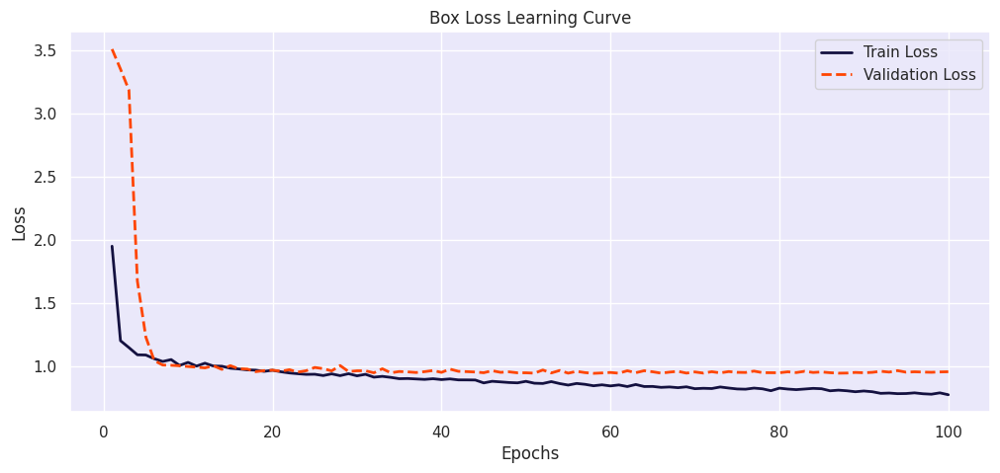

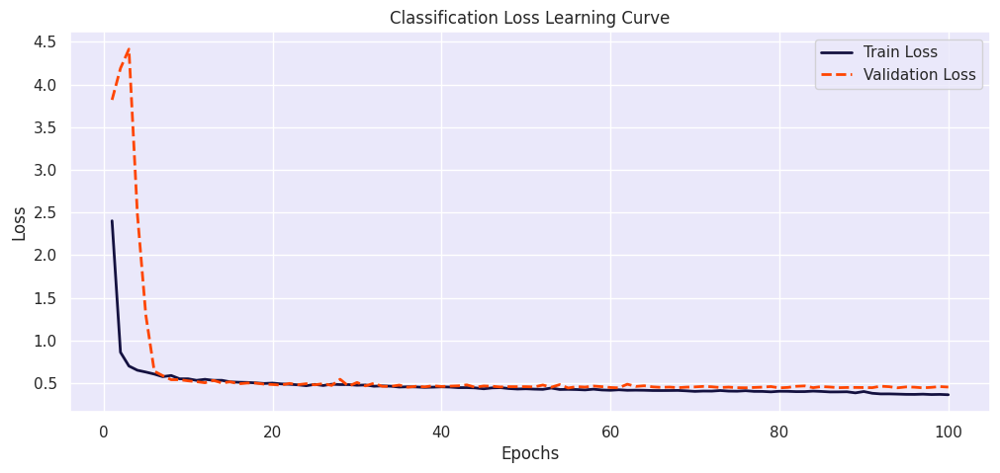

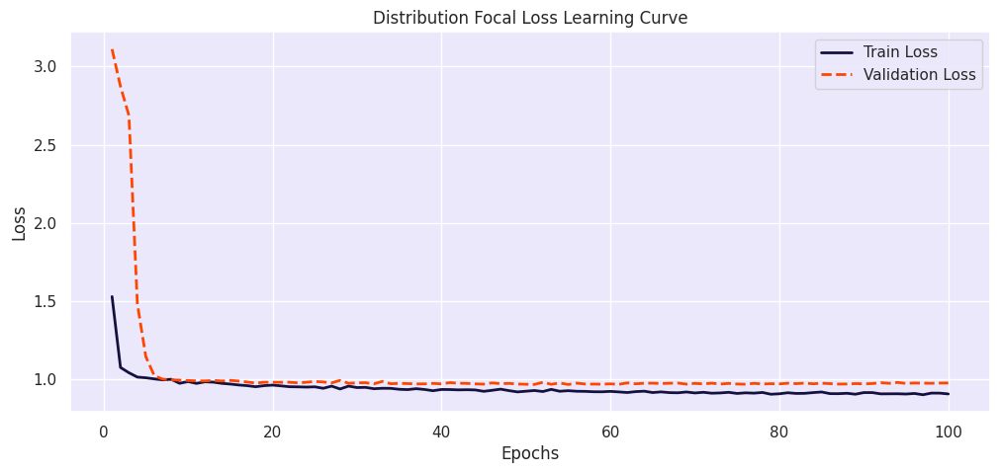

In [ ]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = '/content/runs/detect/train4/results.csv'

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

Model inference and generalization assessment


image 1/1 /content/Vehicle_Detection_Image_Dataset/valid/images/4_mp4-7_jpg.rf.439bc6176789cd7ca6bd686e23fc5ddf.jpg: 640x640 18 Vehicles, 37.0ms
Speed: 2.1ms preprocess, 37.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Vehicle_Detection_Image_Dataset/valid/images/14_mp4-15_jpg.rf.9640ab027504af3733b76827756764eb.jpg: 640x640 4 Vehicles, 37.0ms
Speed: 1.6ms preprocess, 37.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Vehicle_Detection_Image_Dataset/valid/images/test2_mp4-19_jpg.rf.a3723816acc8bacb1350cc05fb78b924.jpg: 640x640 19 Vehicles, 37.0ms
Speed: 1.5ms preprocess, 37.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Vehicle_Detection_Image_Dataset/valid/images/13_mp4-21_jpg.rf.384d3e564126403c9eeb3ad9deebf3a6.jpg: 640x640 4 Vehicles, 32.3ms
Speed: 1.7ms preprocess, 32.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/V

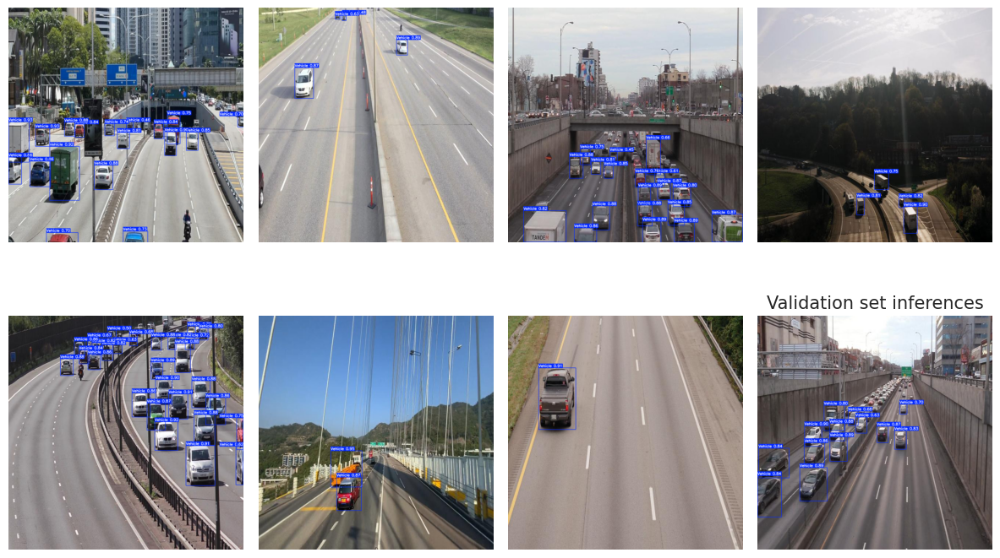

In [ ]:
# Interface on validation set
valid_image_path = os.path.join(dataset_path, 'valid','images')

# list all jpg images in the directory
image_files = [file for file in os.listdir(valid_image_path) if file.endswith('.jpg')]

# selecting 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

fig, axes = plt.subplots(2,4,figsize=(12,8))
plt.title('Validation set inferences', fontsize=15)


# Perform inferences on each selected image and display it
for i, ax, in enumerate(axes.flatten()):
    image_path = os.path.join(valid_image_path, selected_images[i])
    results = best_model.predict(source = image_path, imgsz = 640, conf=0.45)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb =cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout();
plt.show()

Testing on unseen image


image 1/1 /content/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 10 Vehicles, 43.7ms
Speed: 2.1ms preprocess, 43.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


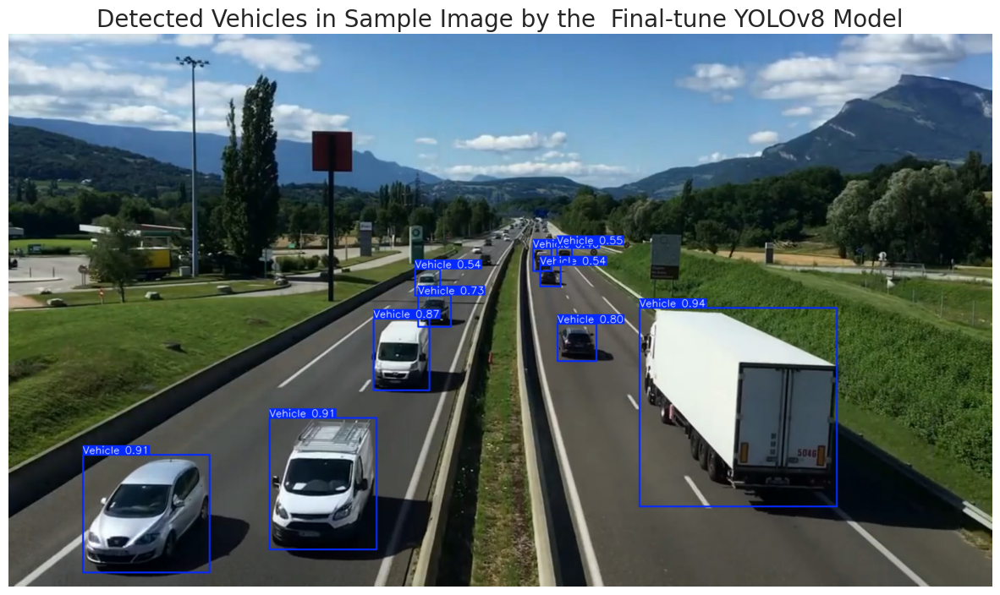

In [ ]:
sample_image_path = '/content/Vehicle_Detection_Image_Dataset/sample_image.jpg'

#Prediction using best_model
results = best_model.predict(source=sample_image_path, imgsz=640,conf=0.45)

sample_image = results[0].plot(line_width=2)

# convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15,10))
plt.imshow(sample_image)
plt.title('Detected Vehicles in Sample Image by the  Final-tune YOLOv8 Model', fontsize=20)
plt.axis('off')
plt.show()

In [ ]:
dataset_video_path = '/content/Vehicle_Detection_Image_Dataset/sample_video.mp4'#source path
video_path = 'sample_video.mp4'# destination path

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
shutil.copyfile(dataset_video_path, video_path)

# prediction using the best_model
best_model.predict(source=video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /content/sample_video.mp4: 384x640 4 Vehicles, 25.2ms
video 1/1 (frame 2/601) /content/sample_video.mp4: 384x640 4 Vehicles, 25.1ms
video 1/1 (frame 3/601) /content/sample_video.mp4: 384x640 4 Vehicles, 25.1ms
video 1/1 (frame 4/601) /content/sample_video.mp4: 384x640 4 Vehicles, 24.5ms
video 1/1 (frame 5/601) /content/sample_video.mp4: 384x640 5 Vehicles, 24.1ms
video 1/1 (frame 6/601) /content/sample_video.mp4: 384x640 5 Vehic

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

Real time traffic intensity estimator

In [ ]:
# threshold for considering traffic as heavy
heavy_traffic_threshold = 12

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Define the vertical range for the slice and lane threshold
x1, x2 = 250, 700
lane_threshold = 609

# Positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)
background_color = (0, 0, 255)

cap = cv2.VideoCapture('sample_video.mp4')

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    ret, frame = cap.read()
    if ret:
        detection_frame = frame.copy()

        # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame

        #Predicting using the model
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)

        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()

        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)

        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1

        # Determining the traffic intensity in each lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"


        # Adding a box for the lanes
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25),
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)

        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25),
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)

        # Adding the vehicle count text
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Adding box for traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25),
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)

        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25),
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane,
                    font, font_scale, font_color, 2, cv2.LINE_AA)


        out.write(processed_frame)

        # cv2.imshow('Real-time Analysis', processed_frame)
        # if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
        #     break
    else:
        break
cap.release()
out.release()

# cv2.destroyAllWindows()


0: 384x640 2 Vehicles, 25.3ms
Speed: 1.8ms preprocess, 25.3ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 25.1ms
Speed: 1.8ms preprocess, 25.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 25.7ms
Speed: 2.3ms preprocess, 25.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 25.3ms
Speed: 2.3ms preprocess, 25.3ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 25.2ms
Speed: 2.1ms preprocess, 25.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 22.5ms
Speed: 1.8ms preprocess, 22.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Vehicles, 21.9ms
Speed: 2.8ms preprocess, 21.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Vehicles, 21.8ms
Speed: 2.6ms preprocess, 21.8ms inference, 1.5ms postprocess per image at

In [ ]:


input_path = "/content/traffic_density_analysis.avi"
output_path = "/content/traffic_density_analysis.mp4"

# Convert the .avi video to .mp4 using ffmpeg
os.system(f'ffmpeg -y -loglevel panic -i "{input_path}" "{output_path}"')

# Check if the output file was generated
if os.path.exists(output_path):
    display(Video(output_path, embed=True, width=960))
else:
    print("Conversion failed. The output file was not generated.")


In [ ]:
# Function to calculate green signal time
def calculate_green_time(n1, n2, n3, n4,i):
    n=[n1,n2,n3,n4]
    total_vehicles = n1 + n2 + n3 + n4
    max_time = 240  # Maximum permitted green light time
    green_time_road = n[i] * max_time / total_vehicles if total_vehicles > 0 else 0
    return green_time_road



0: 640x640 9 Vehicles, 37.2ms
Speed: 3.7ms preprocess, 37.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
No of vehicles in road 1 = 9

0: 640x640 20 Vehicles, 37.0ms
Speed: 2.1ms preprocess, 37.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
No of vehicles in road 2 = 20

0: 640x640 24 Vehicles, 37.0ms
Speed: 3.2ms preprocess, 37.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
No of vehicles in road 3 = 24

0: 640x640 22 Vehicles, 29.3ms
Speed: 2.8ms preprocess, 29.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
No of vehicles in road 4 = 22
Green time for road 1 = 28.80 seconds
Green time for road 2 = 64.00 seconds
Green time for road 3 = 76.80 seconds
Green time for road 4 = 70.40 seconds


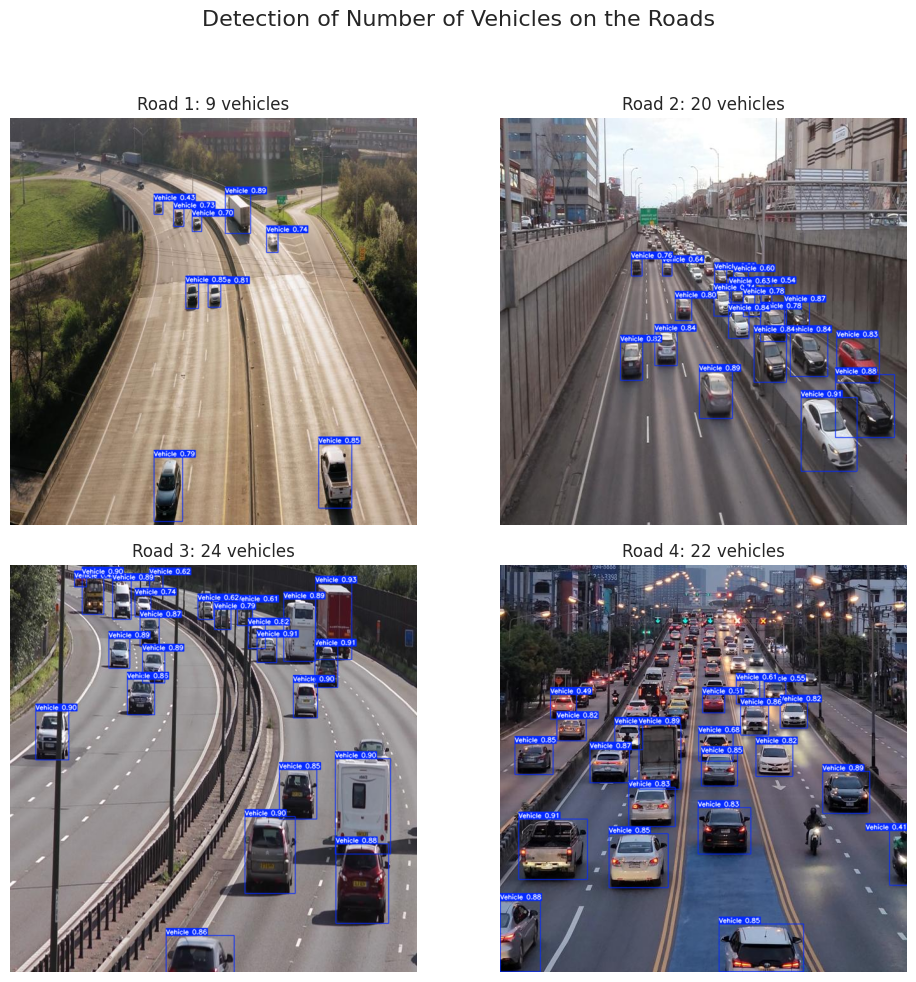

In [ ]:

image_files = os.listdir(train_image_path)

# Define the vertical range for the slice and lane threshold
x1, x2 = 250, 700
lane_threshold = 609

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)
background_color = (0, 0, 255)

road = [0, 1, 2, 3]
n = [0, 0, 0, 0]

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
fig.suptitle('Detection of Number of Vehicles on the Roads', fontsize=16)

for i in road:
    random.seed(32)
    img_file = random.choice(image_files)
    img_path = os.path.join(train_image_path, img_file)

    image = Image.open(img_path)

    detection_frame = cv2.imread(img_path)
    results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
    processed_frame = results[0].plot(line_width=1)

     #Counting the no of bounding boxes in the image
    bounding_boxes = results[0].boxes
    total_no_of_vehicles_in_image = 0
    for box in bounding_boxes.xyxy:
        total_no_of_vehicles_in_image += 1

    # Store the vehicle count for the current road
    n[i] = total_no_of_vehicles_in_image
    print(f"No of vehicles in road {i + 1} = {n[i]}")

    ax = axs[i // 2, i % 2]
    ax.imshow(cv2.cvtColor(processed_frame, cv2.COLOR_BGR2RGB))
    ax.axis('off')
    ax.set_title(f'Road {i + 1}: {total_no_of_vehicles_in_image} vehicles')

#Printing the green light duration
for i in road:
    green_time = calculate_green_time(n[0], n[1], n[2], n[3], i)
    print(f"Green time for road {i + 1} = {green_time:.2f} seconds")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



0: 640x640 12 Vehicles, 37.2ms
Speed: 2.6ms preprocess, 37.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


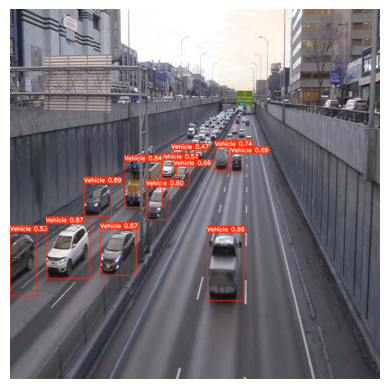

No of vehicles in road 1 = 12

0: 640x640 23 Vehicles, 37.1ms
Speed: 2.3ms preprocess, 37.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


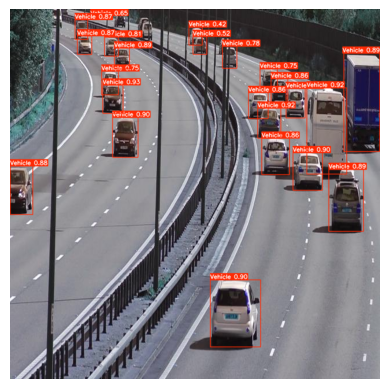

No of vehicles in road 2 = 23

0: 640x640 4 Vehicles, 39.2ms
Speed: 2.3ms preprocess, 39.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


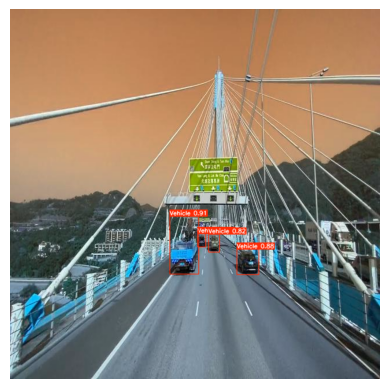

No of vehicles in road 3 = 4

0: 640x640 21 Vehicles, 37.1ms
Speed: 3.7ms preprocess, 37.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


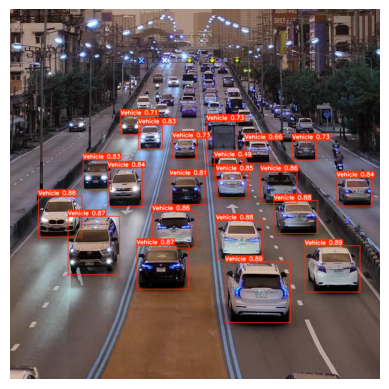

No of vehicles in road 4 = 21
Green time for road 1 = 48.00 seconds
Green time for road 2 = 92.00 seconds
Green time for road 3 = 16.00 seconds
Green time for road 4 = 84.00 seconds


In [ ]:

# Define paths and model (Assuming 'best_model' is already loaded as YOLOv8 model)
image_files = os.listdir(train_image_path)

# Define the vertical range for the slice and lane threshold
x1, x2 = 250, 700
lane_threshold = 609

# Define font and color for text annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text


road = [0, 1, 2, 3]
n = [0, 0, 0, 0]

# Function to calculate green signal time
def calculate_green_time(n1, n2, n3, n4, i):
    n = [n1, n2, n3, n4]
    total_vehicles = n1 + n2 + n3 + n4
    max_time = 240  # Maximum permitted green light time
    green_time_road = n[i] * max_time / total_vehicles
    return green_time_road

# Loop over each road and perform image processing
for i in road:
    # Randomly select an image for the current road
    img_file = random.choice(image_files)
    img_path = os.path.join(train_image_path, img_file)

    # Load and display the image (optional)
    image = Image.open(img_path)
    image.show()  # For debugging purposes (remove if not needed)

    # Perform inference on the modified frame using YOLOv8
    detection_frame = cv2.imread(img_path)
    results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
    processed_frame = results[0].plot(line_width=1)

    plt.imshow(processed_frame)
    plt.axis('off')
    plt.show()

    # Retrieve bounding boxes from the results
    bounding_boxes = results[0].boxes
    total_no_of_vehicles_in_image = 0

    # Count total number of vehicles in the image
    for box in bounding_boxes.xyxy:
        total_no_of_vehicles_in_image += 1

    # Store the vehicle count for the current road
    n[i] = total_no_of_vehicles_in_image
    print(f"No of vehicles in road {i + 1} = {n[i]}")  # 1-indexed for readability

# Calculate and print the green signal time for each road
for i in road:
    green_time = calculate_green_time(n[0], n[1], n[2], n[3], i)
    print(f"Green time for road {i + 1} = {green_time:.2f} seconds")
